# CAPSTONE PROJECT --1042

## Table of Content


1. [Problem Statement](#section1)<br>
2. [Data Loading and Description](#section2)<br>
3. [Data Cleaning and processing](#section3)<br>
    - 3.1 [Understanding the Dataset](#section301)<br/>
    - 3.2 [Pre Processing](#section302)<br/>
4. [Exploratory Data Analysis](#section4)<br>
    - 4.1 [Distribution of Users across Genders](#section401)<br>
    - 4.2 [Distribution of Users across Age segments](#section402)<br>
    - 4.3 [Distribution of Users across Phone Brands](#section403)<br>
    - 4.4 [Which state has highest number of events triggered?](#section404)<br>
    - 4.5 [Distribution of users at different hours.](#section405)<br>
    - 4.6 [Study of usage across a week based on day or night](#section406)<br>
    - 4.7 [Study of usage across a week based on AM or PM](#section407)<br>
    - 4.8 [How the users are distributed across states(Only 6 states are to be considered)](#section408)<br>
    - 4.9 [Distribution of mobile phone usage across the week for the 6 states](#section409)<br>
    - 4.10[Distribution of users across phone brands](#section410)<br>
    - 4.11[Study of Phone Brands for each Age Segment](#section411)<br>
    - 4.12[Analysis of Phone Brands for each State](#section412)<br>
    - 4.13[Distribution of Phone Brands across Gender](#section413)<br>
    - 4.14[Distribution of Gender for each State](#section414)<br>
    - 4.15[Distribution of Age Segments for each State](#section415)<br>
    - 4.16[Cities taken for analysis corresponding to 6 states](#section416)<br>
    - 4.17[Plotting the users on the map](#section417)<br>

<a id="section1"></a>
##  1. Problem statement

InsaidTelecom, one of the leading telecom players, understands that customizing offering is very important for its business to stay competitive. Currently, InsaidTelecom is seeking to leverage behavioral data from more than 60% of the 50 million mobile devices active daily in India to help its clients better understand and interact with their audiences.

In this consulting assignment, we will build a dashboard to understand user's demographic characteristics based on their mobile usage, geolocation, and mobile device properties. Doing so will help millions of developers and brand advertisers around the world pursue data-driven marketing efforts which are relevant to their users and catered to their preferences.

<a id="section2"></a>
## 2. Data Loading and Description
gender_age_train - Devices(device_id) and their respective user gender, age and age_group

phone_brand_device_model - device ids, brand, and models phone_brand: note that few brands are in Chinese

events_data - when a user uses mobile on INSAID Telecom network, the event gets logged in this data.
              Each event has an event id, location (lat/long), and the event corresponds to frequency of mobile usage.
timestamp -   when the user is using the mobile.
city -        city from where event was triggered
state -       state of the city


#### Importing the packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#### Install mysql-connector for downloading the data from the tables

In [2]:
!pip install mysql-connector

In [3]:
import mysql.connector as ms

In [4]:
#For initiating the connection
db=ms.connect(host="cpanel.insaid.co",  # your host 
                     user="student",       # username
                     passwd="student",     # password
                     db="Capstone1")

In [5]:
# Executing the MySQL query to fetch gender age train dataset 
mycursor = db.cursor()

mycursor.execute("SELECT * FROM gender_age_train") 

myresult1 = mycursor.fetchall()  # for fetching all the results
myresult1
report1=pd.DataFrame(data=myresult1)

report1.to_csv("gender_age_train.csv")

In [6]:
# Executing the MySQL query to fetch gender age train data
mycursor2 = db.cursor()

mycursor2.execute("SELECT * FROM phone_brand_device_model")

myresult2 = mycursor2.fetchall()
myresult2
report2=pd.DataFrame(data=myresult2)
#report.head()
#report.tail()
report2.to_csv("phone_brand_device_model.csv")

#### Importing the dataset

In [2]:
# Read the dataset from the csv file
genderagetrain=pd.read_csv('gender_age_train.csv')
brand=pd.read_csv('phone_brand_device_model.csv')
# Read the events dataset
events=pd.read_csv('events_data.csv')
genderagetrain.tail()

,Unnamed: 0,0,1,2,3
74640,74640,4682031842235089751,M,30,M29-31
74641,74641,-9178703742877135986,M,30,M29-31
74642,74642,180946546684162312,M,20,M22-
74643,74643,1390702386071991851,M,37,M32-38
74644,74644,89181010588227347,M,25,M23-26


<a id="section3"></a>
## 3. Data Cleaning and processing

In the upcoming sections we will first understand our dataset using various python functions.
In preprocessing we will deal with erronous and null values of columns.   

<a id="section301"></a>
### 3. Understanding the dataset

In [4]:
# Get the rows and columns of gender age train dataset
genderagetrain.shape

(74645, 5)

In [7]:
# To verify if the dataset gender age train contains any null values
genderagetrain.isnull().any()

Unnamed: 0    False
0             False
1             False
2             False
3             False
dtype: bool

No null values present in gender age train table. However, there is a meaningless index column. So let's remove that.

In [8]:
# Dropping meaningless index columns
genderagetrain=genderagetrain.drop(['Unnamed: 0'], axis=1)
#g

In [9]:
# Adding relevant columns to the gender age train dataset
column_names=['device_id','gender', 'age', 'age_group']
genderagetrain.columns=column_names
genderagetrain.head()

,device_id,gender,age,age_group
0,-8076087639492063270,M,35,M32-38
1,-2897161552818060146,M,35,M32-38
2,-8260683887967679142,M,35,M32-38
3,-4938849341048082022,M,30,M29-31
4,245133531816851882,M,30,M29-31


In [10]:
# To check the count of occurrence of both genders
genderagetrain.gender.value_counts()

M    47904
F    26741
Name: gender, dtype: int64

There are about 47904 data from males and 26741 data from females.

In [11]:
# Dropping meaningless index columns from brand table also
brand=brand.drop(['Unnamed: 0'], axis=1)
brand.head()

,0,1,2
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,小米,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,三星,A368t
4,-2015528097870762664,小米,红米Note2


In [12]:
# Add meaningful columns to the dataset
brand.columns = ['device_id','brand_name','model']
brand.head()

,device_id,brand_name,model
0,1877775838486905855,vivo,Y13
1,-3766087376657242966,小米,V183
2,-6238937574958215831,OPPO,R7s
3,8973197758510677470,三星,A368t
4,-2015528097870762664,小米,红米Note2


In [13]:
# Get the information on the dataset
brand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87726 entries, 0 to 87725
Data columns (total 3 columns):
device_id     87726 non-null int64
brand_name    87726 non-null object
model         87726 non-null object
dtypes: int64(1), object(2)
memory usage: 2.0+ MB


In [14]:
# Get the information about the events table
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3252950 entries, 0 to 3252949
Data columns (total 7 columns):
event_id     float64
device_id    float64
timestamp    object
longitude    float64
latitude     float64
city         object
state        object
dtypes: float64(4), object(3)
memory usage: 173.7+ MB


In [15]:
# Get the shape of the dataset
events.shape

(3252950, 7)

In [16]:
# Check the sum of the null values present for each columns
events.isnull().sum()

event_id       0
device_id    453
timestamp      0
longitude    423
latitude     423
city           0
state        377
dtype: int64

In [17]:
# Check the sum of the null values present for each columns of Phone brand table
brand.isnull().sum()

device_id     0
brand_name    0
model         0
dtype: int64

No null values present in brand table as well. However, we have many Chinese names in brand name columns. 
We will convert first top 16 brands into their English names manually.
Also, we have null values present in events table. 
So this treatment is required.


<a id="section302"></a>
### 3.2 Pre Processing

In [18]:
#Replace top 16 chinese brands with corresponding english name
brand['brand_name']=brand['brand_name'].str.replace('小米', 'Xiaomi')
brand['brand_name']=brand['brand_name'].str.replace('华为', 'Huawei')
brand['brand_name']=brand['brand_name'].str.replace('三星', 'Samsung')
brand['brand_name']=brand['brand_name'].str.replace('魅族', 'Meizu')
brand['brand_name']=brand['brand_name'].str.replace('酷派', 'Coolpad')
brand['brand_name']=brand['brand_name'].str.replace('乐视', 'LeEco')
brand['brand_name']=brand['brand_name'].str.replace('联想', 'Lenovo')
brand['brand_name']=brand['brand_name'].str.replace('Lenovo ', 'Lenovo')   # Replace Lenovo with space with Lenovo
brand['brand_name']=brand['brand_name'].str.replace('努比亚', 'Nubian')
brand['brand_name']=brand['brand_name'].str.replace('中国移动', 'China Mobile')
brand["brand_name"]=brand['brand_name'].str.replace('爱派尔', 'Apple')
brand["brand_name"]=brand['brand_name'].str.replace('奇酷', 'Qi Ku')
brand["brand_name"]=brand['brand_name'].str.replace('锤子', 'Chuizi')
brand["brand_name"]=brand['brand_name'].str.replace('朵唯', 'Duo Wei')
brand["brand_name"]=brand['brand_name'].str.replace('优米', 'You Mi')
brand["brand_name"]=brand['brand_name'].str.replace('海信', 'Haixin')
brand["brand_name"]=brand['brand_name'].str.replace('一加', 'One Plus')

In [19]:
brand.brand_name.value_counts()

Xiaomi          21645
Samsung         19211
Huawei          15181
vivo             7596
OPPO             6717
Meizu            5531
Coolpad          3979
HTC              1272
Lenovo            982
LeEco             841
Nubian            540
LG                360
China Mobile      309
TCL               280
Chuizi            257
Duo Wei           253
You Mi            243
Haixin            218
One Plus          200
Qi Ku             174
语信                170
天语                161
摩托罗拉              106
酷比魔方               78
酷比                 76
美图                 70
ZUK                70
华硕                 67
梦米                 52
富可视                50
                ...  
奥克斯                 4
德赛                  4
金星数码                4
虾米                  4
惠普                  3
智镁                  3
欧乐迪                 3
飞利浦                 3
优语                  3
宝捷讯                 3
PPTV                2
唯比                  2
本为                  2
首云                  2
飞秒        

We will not consider all the brands. Considering only top 21 brands and converting rest 95 brands into Others.

In [20]:
# Creating a list of top 21 brands and replacing rest 95 brands with others
top_mobiles=['Xiaomi', 'Samsung', 'Huawei', 'vivo', 'OPPO', 'Meizu', 'Coolpad', 'HTC', 'Lenovo' , 'LeEco', 'Nubian', 'LG', 'China Mobile', 'TCL', 'Apple', 'Chuizi', 'Duo Wei', 'You Mi', 'Haixin', 'One Plus', 'Qi Ku']
uniquebrands=list(brand.brand_name.unique())  # Creating a list of distinct occurrence of brands

# Getting the list of 95 brands which are to be converted into Others
otherphones=list(set(uniquebrands) - set(top_mobiles))

# Iterate over rest 95 brands and convert them into Others
for item in otherphones:
    brand['brand_name']=brand['brand_name'].replace(to_replace=item, value = 'Others')

# Get the distinct brands now after converting into others
brand.brand_name.unique()

array(['vivo', 'Xiaomi', 'OPPO', 'Samsung', 'Coolpad', 'Lenovo', 'Huawei',
       'Qi Ku', 'Meizu', 'Others', 'China Mobile', 'HTC', 'LG', 'You Mi',
       'Nubian', 'Chuizi', 'LeEco', 'Haixin', 'One Plus', 'Duo Wei',
       'TCL', 'Apple'], dtype=object)

In [21]:
# Get the count of occurrence of each category
brand.brand_name.value_counts()

Xiaomi          21645
Samsung         19211
Huawei          15181
vivo             7596
OPPO             6717
Meizu            5531
Coolpad          3979
Others           1891
HTC              1272
Lenovo            982
LeEco             841
Nubian            540
LG                360
China Mobile      309
TCL               280
Chuizi            257
Duo Wei           253
You Mi            243
Haixin            218
One Plus          200
Qi Ku             174
Apple              46
Name: brand_name, dtype: int64

Now, null values present in latitude, longitude, city and states columns of events table has to be treated.

In [22]:
# Replace the nulls values in device_id column
events_device_id = pd.isnull(events.device_id)

In [23]:
# Replace the null device id with device id where longitudes are same and device id is not null

for var in events[events_device_id]["longitude"].unique(): # get the longitude of null device id 
    #search the longitude in data frame from which device id is not null
    dic_id = events.loc[  (events["longitude"] == var) & ( pd.notnull (events["device_id"] ) ) ].iloc[0,1]
    events.loc[ (events["longitude"] == var) &  pd.isnull(events[ "device_id"] ), "device_id"]= dic_id

In [24]:
# Null values for device id is not present as they are treated now.
events.isnull().sum()

event_id       0
device_id      0
timestamp      0
longitude    423
latitude     423
city           0
state        377
dtype: int64

In [25]:
# Replace state null values
event_state_ser = pd.isnull(events.state)
events[event_state_ser]

,event_id,device_id,timestamp,longitude,latitude,city,state
16649,191851.0,-6.242501e+18,2016-05-02 05:50:53,77.293991,28.749820,Delhi,NaN
16836,341684.0,-6.242501e+18,2016-05-02 08:37:46,77.293991,28.749820,Delhi,NaN
17247,658755.0,-6.242501e+18,2016-05-02 10:10:57,77.293991,28.749820,Delhi,NaN
17339,720866.0,-6.242501e+18,2016-05-02 20:55:28,77.293991,28.749820,Delhi,NaN
17696,983707.0,-6.242501e+18,2016-05-03 10:25:17,77.293991,28.749820,Delhi,NaN
18431,1573296.0,-6.242501e+18,2016-05-02 08:31:43,77.293991,28.749820,Delhi,NaN
18452,1586268.0,-6.242501e+18,2016-05-02 18:23:25,77.293991,28.749820,Delhi,NaN
18454,1586328.0,-6.242501e+18,2016-05-02 18:25:36,77.293991,28.749820,Delhi,NaN
18504,1630796.0,-6.242501e+18,2016-05-02 00:15:24,77.293991,28.749820,Delhi,NaN
19349,2305375.0,-6.242501e+18,2016-05-02 05:14:54,77.293991,28.749820,Delhi,NaN


In [26]:
#replace the state name with state name of same longitude value

for var in events[event_state_ser]["longitude"].unique():
    state_name = events.loc[  (events["longitude"] == var) & ( pd.notnull (events["state"] ) ) ].iloc[0,6]
    events.loc[ (events["longitude"] == var) &  pd.isnull(events["state"] ), "state"]= state_name

In [27]:
# Replace longitude null value with longitude having same device_id

event_long_ser = pd.isnull(events.longitude)
for var in events[event_long_ser]["device_id"].unique():
    longitude_value = events.loc[  (events["device_id"] == var) & ( pd.notnull (events["longitude"] ) ) ].iloc[0,3]
    events.loc[ (events["device_id"] == var) &  pd.isnull(events[ "longitude"] ), "longitude"]= longitude_value

In [28]:
# Replace latitude null value with latitude having same device_id

event_lat_ser = pd.isnull(events.latitude)
for var in events[event_lat_ser]["device_id"].unique():
    latitude_value = events.loc[  (events["device_id"] == var) & ( pd.notnull (events["latitude"] ) ) ].iloc[0,4]
    events.loc[ (events["device_id"] == var) &  pd.isnull(events[ "latitude"] ), "latitude"]= latitude_value

In [29]:
# Now no null values are present as they all have been treated
events.isnull().sum()

event_id     0
device_id    0
timestamp    0
longitude    0
latitude     0
city         0
state        0
dtype: int64

No null values are present and we are ready to analyze based on many criteria.

<a id="section4"></a>
## 4.Exploratory Data Analysis

<a id="section401"></a>
### 4.1 Distribution of Users across Genders.

In [30]:
# Getting the count of males and females
genderagetrain.gender.value_counts()

M    47904
F    26741
Name: gender, dtype: int64

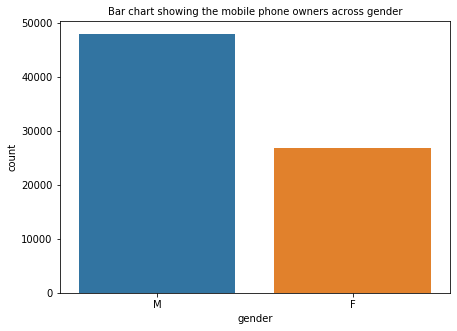

In [31]:
plt.figure(figsize=(7, 5))
plt.title('Bar chart showing the mobile phone owners across gender', fontsize=10)
sns.countplot('gender',data=genderagetrain)

Mobile phone owners are mostly males and this can be easily understood, considering the condition of woman in India.
Still, majority of Indian woman are not economically self reliant. Hence the number of females owning mobiles phones is still
less.

<a id="section402"></a>
### 4.2 Distribution of Users across Age segments.

A device ID (device identification) is a distinctive number associated with a smartphone or similar handheld device.

In [32]:
# Distribution of ownership of devices across different age groups
genderagetrain.age_group.value_counts()

M23-26    9605
M32-38    9476
M39+      8581
M22-      7488
M29-31    7309
F33-42    5561
M27-28    5445
F23-      5050
F29-32    4628
F43+      4194
F24-26    4190
F27-28    3118
Name: age_group, dtype: int64

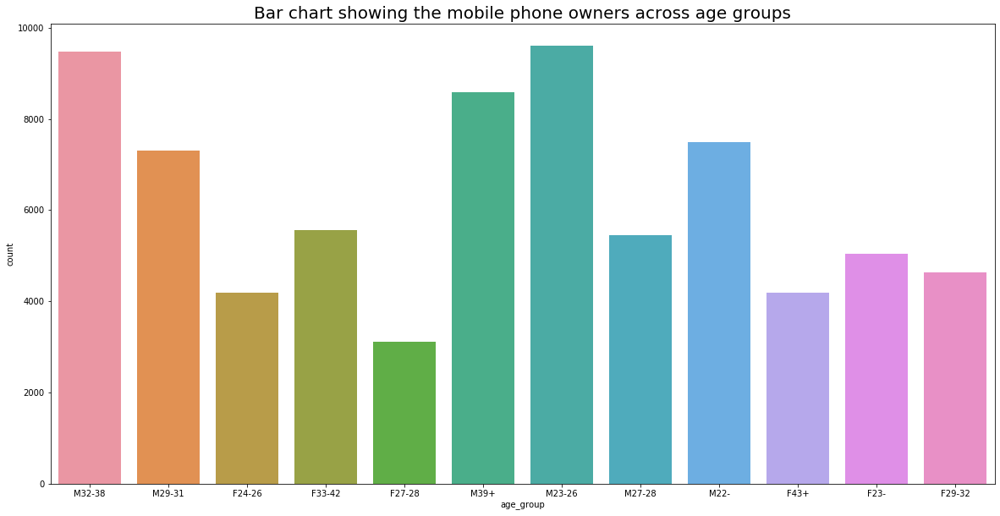

In [33]:
plt.figure(figsize=(20, 10))
plt.title('Bar chart showing the mobile phone owners across age groups', fontsize=20)
sns.countplot('age_group',data=genderagetrain)

<a id="section403"></a>
### 4.3 Distribution of Users across Phone Brands

In [34]:
# Device id values are only occurring once
brand.device_id.value_counts()

 4297421574931963628    1
-6683447465042266790    1
-2025398450464681486    1
-2104282943635898244    1
-1079794670707116889    1
-3003947317223688073    1
-3130112716144912618    1
 8744984335443938538    1
 320428528992037030     1
-6409354645228834731    1
-4605982543691085056    1
-6908741980914867886    1
 1938498014635642053    1
-6669274912682130457    1
-773564855768814905     1
-8897002098221859467    1
-2525148510460889665    1
 144547845295230484     1
 4465890686843969881    1
 712059563380046924     1
-4682431785316854483    1
 1516988197740957946    1
 7860223122706003536    1
 7992754078778403119    1
-7652844137021471969    1
-9020422666513516342    1
-2046963218595338598    1
 8262970366291716511    1
 8906097318572402404    1
-3030435577072838900    1
                       ..
-919083506846518244     1
 54658926811215127      1
-2750229901605017308    1
 3915432605531142531    1
-4314659022027338411    1
 3833044733422876778    1
 2765900699322072858    1
 14438277369

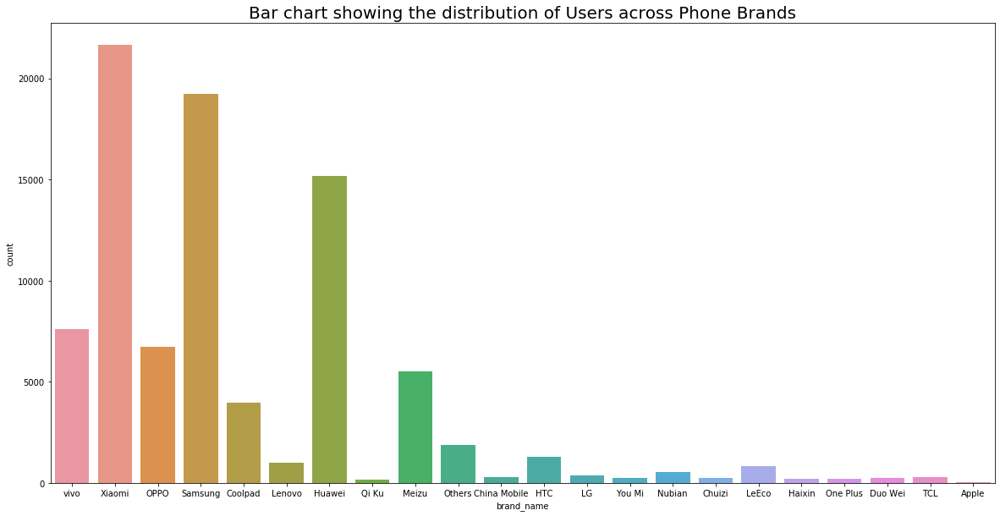

In [35]:
plt.figure(figsize=(20, 10))
plt.title('Bar chart showing the distribution of Users across Phone Brands', fontsize=20)
sns.countplot('brand_name',data=brand)

<a id="section404"></a>
###  4.4 Which state has highest number of events triggered?

In [36]:
# Considering all states in the dataset
events.state.value_counts()

Delhi                       751797
Maharashtra                 677168
TamilNadu                   436329
AndhraPradesh               321379
MadhyaPradesh               232741
Rajasthan                   196410
WestBengal                  196203
Karnataka                    99072
UttarPradesh                 94750
Gujarat                      42881
Bihar                        35472
Punjab                       26195
Kerala                       23148
Haryana                      21053
Jharkhand                    18060
Orissa                       15904
Telangana                    12784
Assam                        12021
Chhattisgarh                  9754
Uttaranchal                   7720
JammuandKashmir               5385
Goa                           3250
Nagaland                      2298
Pondicherry                   1741
Mizoram                       1613
AndamanandNicobarIslands      1515
Meghalaya                     1515
HimachalPradesh               1409
Manipur             

We have highest events triggered from Delhi state followed by Maharashtra and Tamil Nadu.
Lowest events triggered from Arunachal Pradesh.

<a id="section405"></a>
### 4.5 Distribution of users at different hours.

Break down timestamp into date, time, hours, days of week, AM/PM and day/night.
We have considered day as time between 6 AM to 6PM(both inclusive).
Similarly, 6PM to 6 AM is being considered as night.

In [37]:
events['Date'] = pd.to_datetime(events['timestamp']).dt.date  # Break timestamp into date and time
events['Time'] = pd.to_datetime(events['timestamp']).dt.time

In [38]:
# Further break Date into Day of week and categorize days into weekdays and weekends
events['dayofweek'] = events.apply(lambda row : row['Date'].strftime("%A"), axis = 1)
events['week/weekend']=events.apply(lambda row: 'weekend' if  (row['dayofweek']=='Sunday' or row['dayofweek']=='Saturday') else 'Weekday',axis =1)

In [39]:
# Furthermore breaking down time into Hour and AM/PM
events['Hour'] = events.apply(lambda row : row['Time'].strftime("%H"), axis = 1)
events['AM/PM'] = events.apply(lambda row: 'PM' if int(row['Hour']) >= 12 else 'AM',axis=1)
# If time is between 6 AM and 6PM, then marking it as day else night.
events['Day/Night'] = events.apply(lambda row: 'Day' if (row['Hour'] >= '06' and row['Hour'] <= '18') else 'Night',axis=1)

In [40]:
events.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,dayofweek,week/weekend,Hour,AM/PM,Day/Night
0,1.0,2.918269e+16,2016-05-01 00:55:25,77.266049,28.68161,Delhi,Delhi,2016-05-01,00:55:25,Sunday,weekend,00,AM,Night
1,7104.0,2.918269e+16,2016-05-02 09:37:02,77.266049,28.68161,Delhi,Delhi,2016-05-02,09:37:02,Monday,Weekday,09,AM,Day
2,29661.0,2.918269e+16,2016-05-04 00:56:04,77.266049,28.68161,Delhi,Delhi,2016-05-04,00:56:04,Wednesday,Weekday,00,AM,Night
3,33133.0,2.918269e+16,2016-05-06 05:01:15,77.266049,28.68161,Delhi,Delhi,2016-05-06,05:01:15,Friday,Weekday,05,AM,Night
4,38980.0,2.918269e+16,2016-05-06 09:55:04,77.266049,28.68161,Delhi,Delhi,2016-05-06,09:55:04,Friday,Weekday,09,AM,Day


Now many analysis can be done on events table as it contains separate columns for weekday/weekends, AM/PM and day/night. 

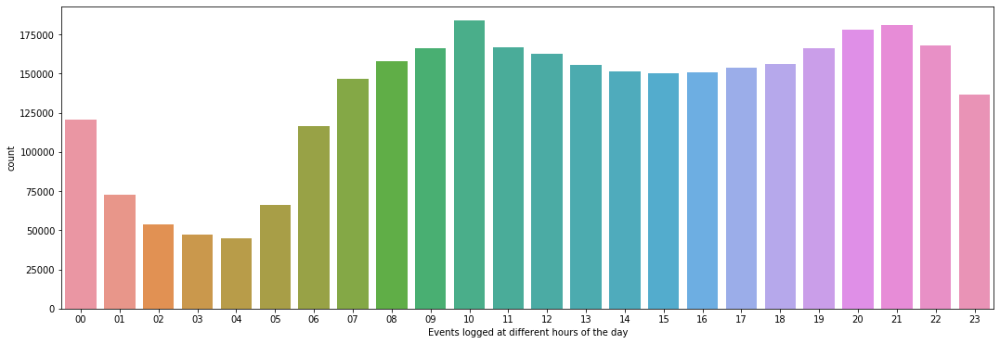

In [41]:
fig,ax =plt.subplots(figsize=(18,6))
sns.countplot(data=events,x = 'Hour');
plt.xlabel('Events logged at different hours of the day');

Note that events are highest from 9AM to 12 PM. This is simple to understand as this is the office hour and too many people will be triggering events from their phones.
There is a sudden increase in events from 6 PM to 9 PM.
This is the time when people are free from their work and spend some time on mobiles phones talking to relatives, friends. 
Also, events decrease from 10 PM to midnight and lowest at around 4 AM.
This is mostly sleeping time.
Telecom companies can target these times as downtimes for their upgrade and maintenance activities.

<a id="section406"></a>
### 4.6 Study of usage across a week based on day or night

We should consider that only one instance of a particular User(device_id) as a user(device_id) can do multiple phone calls and trigger multiple events.
Taking every instance of the same user can give misleading numbers. Lets drop the duplicate rows basis device id

In [42]:
distinct_events = events.drop_duplicates(subset='device_id', keep='first')

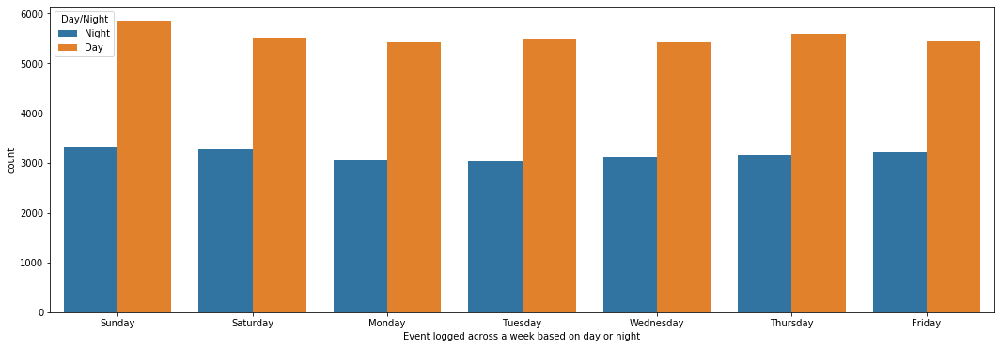

In [43]:
fig,ax =plt.subplots(figsize=(18,6))
sns.countplot(data=distinct_events,x = 'dayofweek', hue='Day/Night');
plt.xlabel('Event logged across a week based on day or night');

Phones usage is maximum on Sunday followed by Saturday. Sunday is leading as more number of people get free time to use their mobiles phones. 
Also, more phones are used during daytime(6AM to 6PM). However, usage on Friday, Saturday and Sunday night are highest if only night time are considered. This is understandable as during these nights people use mobiles phones for calls, SMS, video calls to interact with family and friends.

<a id="section407"></a>
### 4.7 Study of usage across a week based on AM or PM

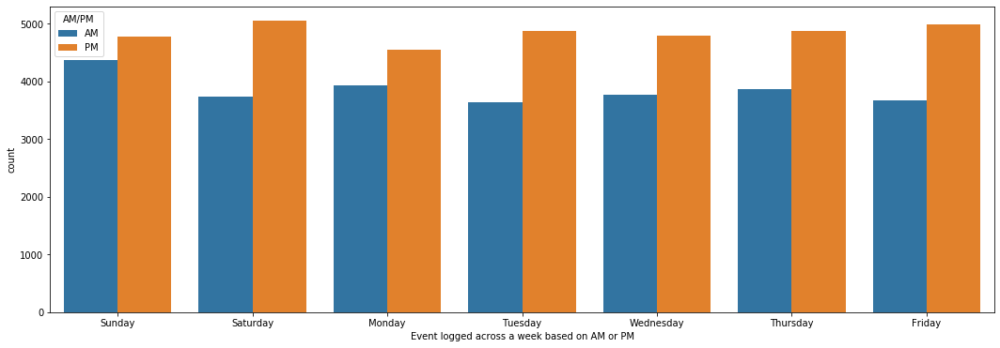

In [44]:
fig,ax =plt.subplots(figsize=(18,6))
sns.countplot(data=distinct_events,x = 'dayofweek', hue='AM/PM');
plt.xlabel('Event logged across a week based on AM or PM');

Difference in mobile usage in AM or PM is least on Sunday. People are more active during morning as they have more free time.
This difference is highest on Friday and Saturday. Being next day holidays, people tend to spend time with their phones during late night also which can include certain events like video calls, video buffering, texts and calls.

<a id="section408"></a>
### 4.8 How the users are distributed across states(Only 6 states are to be considered

In [45]:
# Create a list of 6 states to be studied
states=['Karnataka', 'Bihar', 'WestBengal', 'Kerala', 'Gujarat', 'Punjab']
eventinstate=distinct_events.state.isin(states)
events_statewise=distinct_events[eventinstate]

Text(0.5, 1.0, 'Donut Plot showing the usage percentage of the six states')

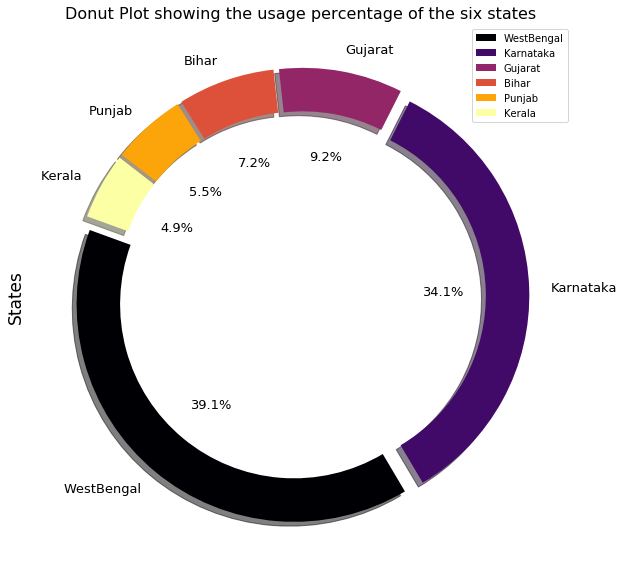

In [46]:

#Using kind='pie' to plot a donut plot, also setting explode values so that it takes a donut shape instead of a pie shape.plt.figure(figsize=(15,15))
space = [0.05,0.05,0.05,0.05,0.05, 0.05]
events_statewise['state'].value_counts().plot(kind='pie', fontsize=13,explode=space, autopct='%2.1f%%', wedgeprops=dict(width=0.2), 
                                       shadow=True, startangle=160, legend=True, figsize=(10,10), cmap='inferno')

plt.ylabel('States', fontsize=17)
plt.title('Donut Plot showing the usage percentage of the six states', fontsize=16)

Out of the given 6 states, West Bengal has most number of mobile phone users(~40%) followed by Karnataka. Kerala has the lowest mobile phone usage.

<a id="section409"></a>
### 4.9 Distribution of mobile phone usage across the week for the 6 states.

In [47]:
events_statewise.head()

,event_id,device_id,timestamp,longitude,latitude,city,state,Date,Time,dayofweek,week/weekend,Hour,AM/PM,Day/Night
2829979,74778.0,6.173131e+18,2016-05-01 08:02:02,88.397480,22.652160,Calcutta,WestBengal,2016-05-01,08:02:02,Sunday,weekend,08,AM,Day
2829985,74799.0,-5.235317e+18,2016-05-01 08:04:22,88.444538,22.642112,Calcutta,WestBengal,2016-05-01,08:04:22,Sunday,weekend,08,AM,Day
2830008,74819.0,-1.858318e+18,2016-05-01 08:19:40,88.418604,22.666322,Calcutta,WestBengal,2016-05-01,08:19:40,Sunday,weekend,08,AM,Day
2830019,74825.0,-4.735382e+18,2016-05-01 08:02:15,88.378589,22.619043,Calcutta,WestBengal,2016-05-01,08:02:15,Sunday,weekend,08,AM,Day
2830033,74827.0,-4.401622e+18,2016-05-01 08:40:32,88.458047,22.626797,Calcutta,WestBengal,2016-05-01,08:40:32,Sunday,weekend,08,AM,Day


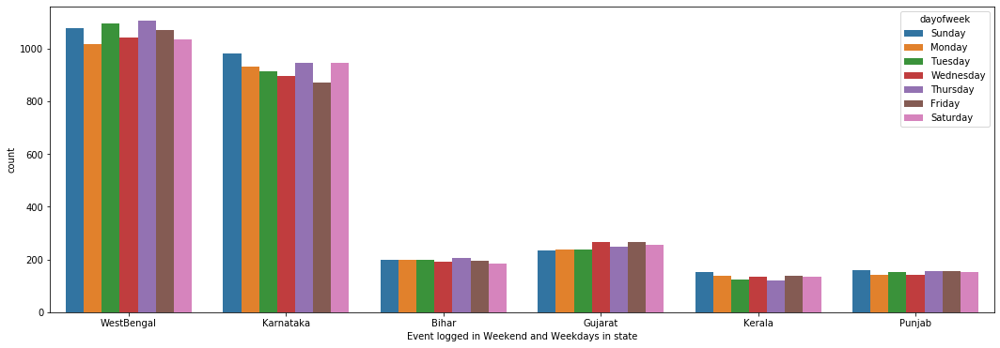

In [48]:
fig,ax =plt.subplots(figsize=(18,6))
sns.countplot(data=events_statewise,x = 'state', hue='dayofweek');
plt.xlabel('Event logged in Weekend and Weekdays in state');

In [49]:
# Converting data type of device id present in events table from float64 to int64 as other 2 tables have data type as int 64
events_statewise['device_id']=events_statewise['device_id'].astype(np.int64)
events_statewise.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19032 entries, 2829979 to 3252949
Data columns (total 14 columns):
event_id        19032 non-null float64
device_id       19032 non-null int64
timestamp       19032 non-null object
longitude       19032 non-null float64
latitude        19032 non-null float64
city            19032 non-null object
state           19032 non-null object
Date            19032 non-null object
Time            19032 non-null object
dayofweek       19032 non-null object
week/weekend    19032 non-null object
Hour            19032 non-null object
AM/PM           19032 non-null object
Day/Night       19032 non-null object
dtypes: float64(3), int64(1), object(10)
memory usage: 2.8+ MB


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


Dataset mainly consists of data from Calcutta and Bangalore. As the population of Bangalore and Calcutta is very high, hence number of users are exceptionally high in Karnataka and West Bengal.

In [50]:
# Check the data types of all column values in events table
events_statewise.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19032 entries, 2829979 to 3252949
Data columns (total 14 columns):
event_id        19032 non-null float64
device_id       19032 non-null int64
timestamp       19032 non-null object
longitude       19032 non-null float64
latitude        19032 non-null float64
city            19032 non-null object
state           19032 non-null object
Date            19032 non-null object
Time            19032 non-null object
dayofweek       19032 non-null object
week/weekend    19032 non-null object
Hour            19032 non-null object
AM/PM           19032 non-null object
Day/Night       19032 non-null object
dtypes: float64(3), int64(1), object(10)
memory usage: 2.8+ MB


In [51]:
# Check the data types of all column values in events table
brandeventsstate.info()

NameError: name 'brandeventsstate' is not defined

<a id="section410"></a>
### 4.10 Distribution of users across phone brands

Join the events table with brand table based on device_id as device_id is the common column between these 2 tables.

In [52]:
brand_event = pd.merge(brand, events_statewise, on='device_id', how='inner')

In [53]:
brand_event_distinct = brand_event.drop_duplicates(subset='device_id', keep="first")
brand_event_distinct.head()

,device_id,brand_name,model,event_id,timestamp,longitude,latitude,city,state,Date,Time,dayofweek,week/weekend,Hour,AM/PM,Day/Night
0,222740959161491776,Xiaomi,MI 2S,337608.0,2016-05-05 01:13:29,74.942416,31.715439,Amritsar,Punjab,2016-05-05,01:13:29,Thursday,Weekday,01,AM,Night
1,-330528020479569088,Huawei,Ascend P7,552614.0,2016-05-04 14:12:17,77.621390,13.029946,Bangalore,Karnataka,2016-05-04,14:12:17,Wednesday,Weekday,14,PM,Day
2,-228846787598753152,Meizu,MX3,276182.0,2016-05-07 10:32:15,88.413496,22.561318,Chakdaha,WestBengal,2016-05-07,10:32:15,Saturday,weekend,10,AM,Day
3,67374767746444376,Xiaomi,红米note,201154.0,2016-05-03 12:33:27,74.519307,30.273474,Malaut,Punjab,2016-05-03,12:33:27,Tuesday,Weekday,12,PM,Day
4,-6822846597800440832,Xiaomi,MI 3,76783.0,2016-05-04 09:00:21,88.397726,22.605248,Calcutta,WestBengal,2016-05-04,09:00:21,Wednesday,Weekday,09,AM,Day


Text(0.5, 1.0, 'Bar Chart showing the percentage of users owning different phone brands')

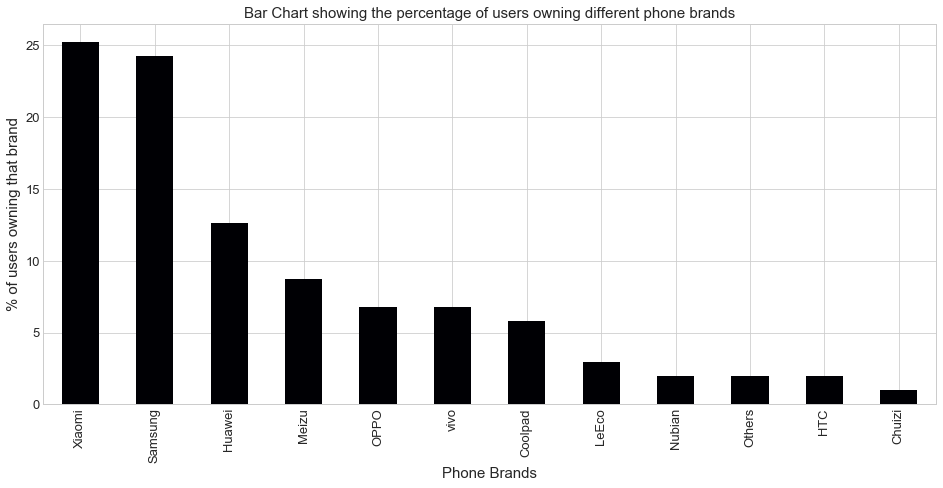

In [54]:
#Bar Chart showing the percentage of users owning phones of that brand
# Xiaomi is the most popular brand followed by Samsung, Huawei and Vivo
# Xiaomi builds phones in all budget ranges. Same is the case with Samsung. Thus they are highest selling. 
# Other phones like HTC, Lenovo mainly build high budget phones. So they are even below than Meizu and other brands.

plt.style.use('seaborn-whitegrid')
((brand_event_distinct['brand_name'].value_counts() / len(brand_event_distinct)) * 100).plot(kind='bar', figsize=(16,7), colormap='magma', fontsize=13)

plt.xlabel('Phone Brands', fontsize=15)
plt.ylabel('% of users owning that brand', fontsize=15)
plt.title('Bar Chart showing the percentage of users owning different phone brands', fontsize=15)

Merging all three tables based on device_id to analyze further.

In [55]:
master_data=pd.merge(brand_event_distinct, genderagetrain, on='device_id', how='inner')

In [56]:
master_data.head()

,device_id,brand_name,model,event_id,timestamp,longitude,latitude,city,state,Date,Time,dayofweek,week/weekend,Hour,AM/PM,Day/Night,gender,age,age_group
0,222740959161491776,Xiaomi,MI 2S,337608.0,2016-05-05 01:13:29,74.942416,31.715439,Amritsar,Punjab,2016-05-05,01:13:29,Thursday,Weekday,01,AM,Night,M,32,M32-38
1,-330528020479569088,Huawei,Ascend P7,552614.0,2016-05-04 14:12:17,77.621390,13.029946,Bangalore,Karnataka,2016-05-04,14:12:17,Wednesday,Weekday,14,PM,Day,F,65,F43+
2,-228846787598753152,Meizu,MX3,276182.0,2016-05-07 10:32:15,88.413496,22.561318,Chakdaha,WestBengal,2016-05-07,10:32:15,Saturday,weekend,10,AM,Day,F,63,F43+
3,67374767746444376,Xiaomi,红米note,201154.0,2016-05-03 12:33:27,74.519307,30.273474,Malaut,Punjab,2016-05-03,12:33:27,Tuesday,Weekday,12,PM,Day,F,25,F24-26
4,-6822846597800440832,Xiaomi,MI 3,76783.0,2016-05-04 09:00:21,88.397726,22.605248,Calcutta,WestBengal,2016-05-04,09:00:21,Wednesday,Weekday,09,AM,Day,M,26,M23-26


<a id="section411"></a>
### 4.11 Study of Phone Brands for each Age Segment

In [57]:
# To check if the master data table contains any null values
master_data.isnull().sum()

device_id       0
brand_name      0
model           0
event_id        0
timestamp       0
longitude       0
latitude        0
city            0
state           0
Date            0
Time            0
dayofweek       0
week/weekend    0
Hour            0
AM/PM           0
Day/Night       0
gender          0
age             0
age_group       0
dtype: int64

Text(0.5, 1.0, 'Age Group vs Phone Brand')

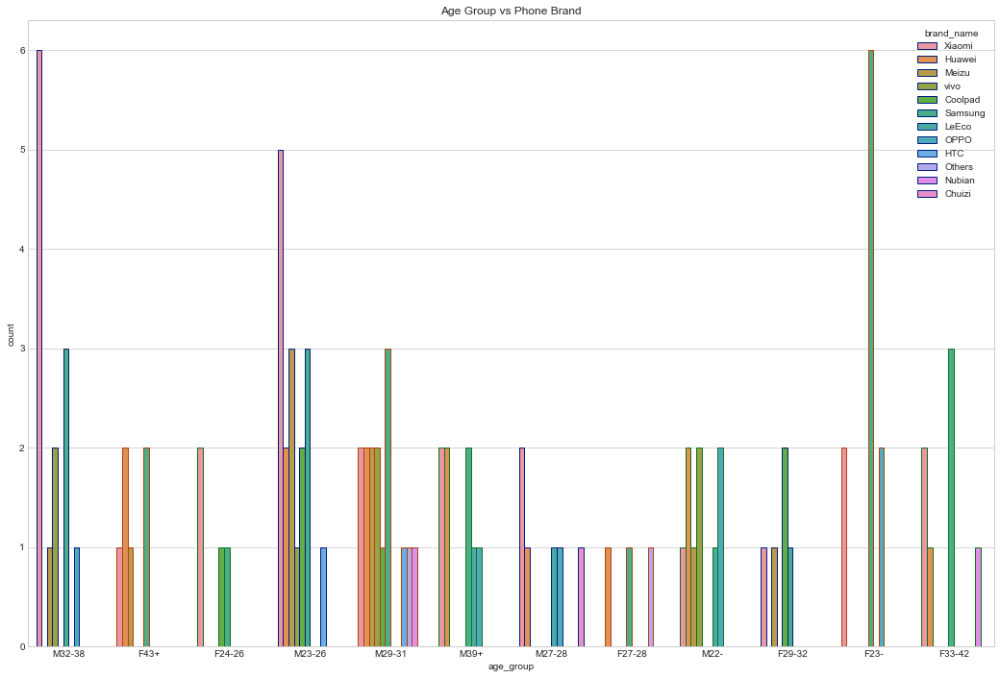

In [58]:
fig,ax =plt.subplots(figsize=(18,12))
sns.countplot(data = master_data,x = 'age_group', hue='brand_name', edgecolor=sns.color_palette("dark", 3))
plt.title('Age Group vs Phone Brand')

Xiaomi and Samsung are popular brands across almost all age groups.

<a id="section412"></a>
### 4.12 Analysis of Phone Brands for each State

Text(0.5, 1.0, 'Popularity of phone brands in states')

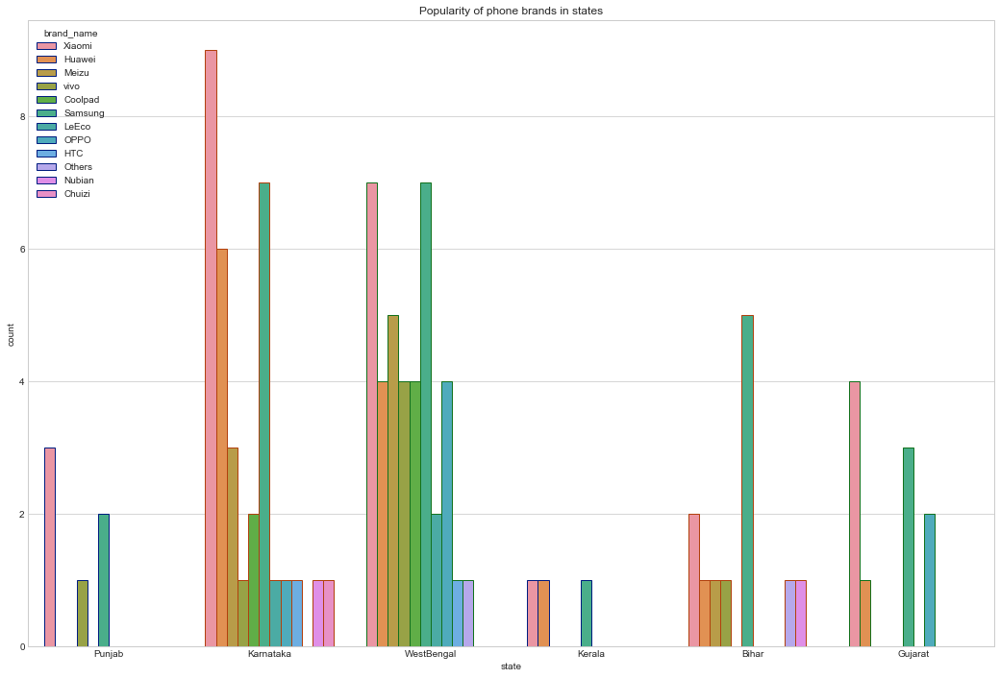

In [59]:
fig,ax =plt.subplots(figsize=(18,12))
sns.countplot(data = master_data,x = 'state', hue='brand_name', edgecolor=sns.color_palette("dark", 3))
plt.title('Popularity of phone brands in states')

In the given dataset, Xiaomi is the leading brand when it comes to popularity in Karnataka, Gujarat and Punjab. However, Samsung is giving a tough competition to Xiaomi in West Bengal and more pupular in Bihar.

<a id="section413"></a>
### 4.13 Distribution of Phone Brands across Gender

Text(0.5, 1.0, 'Phone Brands usage across males and females')

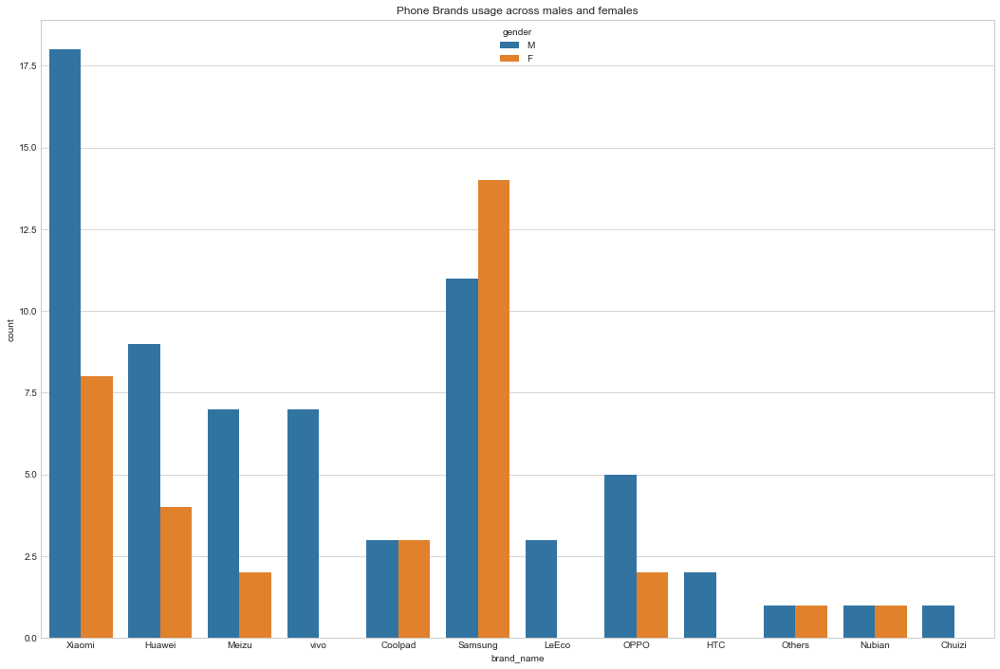

In [60]:
fig,ax =plt.subplots(figsize=(18,12))
sns.countplot(data = master_data,x = 'brand_name', hue='gender')
plt.title('Phone Brands usage across males and females')

Popularity of Samsung is more in females than males. Brands such as Coolpad, Nubian and other chinese phones have same percentage of customers irrespective of gender.
Also, in the given datatset, Vivo and LeEco phones are not much popular in females.
These brands can manufacture keeping females as their customer segments.

<a id="section414"></a>
### 4.14 Distribution of Gender for each State.

Text(0.5, 1.0, 'Group vs Phone Brand')

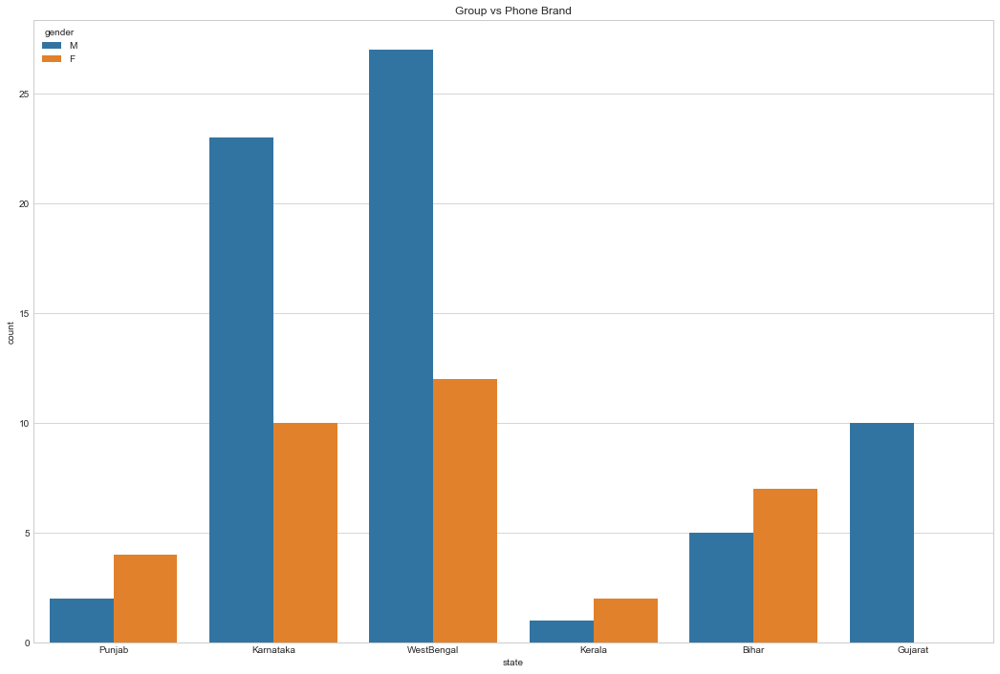

In [61]:
fig,ax =plt.subplots(figsize=(18,12))
sns.countplot(data = master_data,x = 'state', hue='gender')
plt.title('Group vs Phone Brand')

Females are using more mobiles phones in Punjab, Kerala and Bihar. However, males are more active and busy on phones in West Bengal and Karnataka. We do not have enough data to comment on Gujarat.
Companies can target females customer base in Karnataka and West Bengal.

<a id="section415"></a>
### 4.15 Distribution of Age Segments for each State

<function matplotlib.pyplot.legend(*args, **kwargs)>

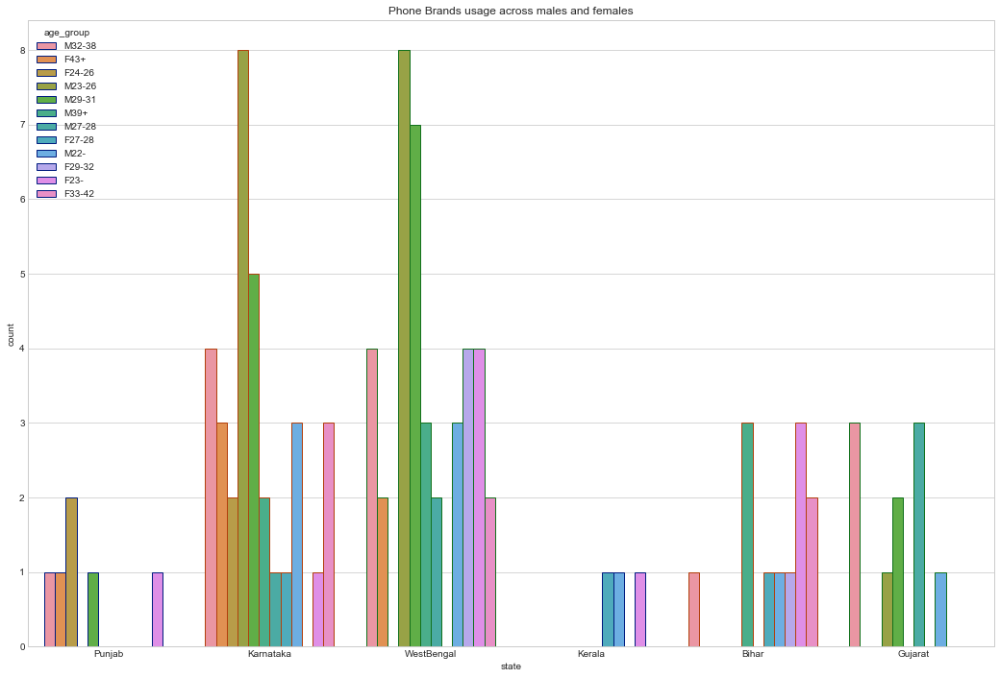

In [62]:
fig,ax =plt.subplots(figsize=(18,12))
sns.countplot(data = master_data,x = 'state', hue='age_group', edgecolor=sns.color_palette("dark", 3))
plt.title('Phone Brands usage across males and females')
plt.legend

In the given dataset, males between age group 23-26 trigger most number of events in Karnataka and West Bengal. This is quite evident from the fact that the dataset contains majority of records from these two states.
However, we do not have enough data to comment on Kerala or Punjab.
In Bihar, most number of mobile phone users come from males of age group in 27-28 and females with age less than 23.
In Gujarat, males aged between 32-38 trigger most number of events from their phones in the form of app usage, texts, phone calls, video calls and video buffering.

<a id="section416"></a>
### 4.16 Cities taken for  analysis corresponding to 6 states

In [63]:
# Number of unique cities taken for the analysis
events_statewise.groupby('state')['city'].nunique()

state
Bihar         43
Gujarat       55
Karnataka     61
Kerala        29
Punjab        34
WestBengal    89
Name: city, dtype: int64

A total of 311 cities were taken for study across these 6 states

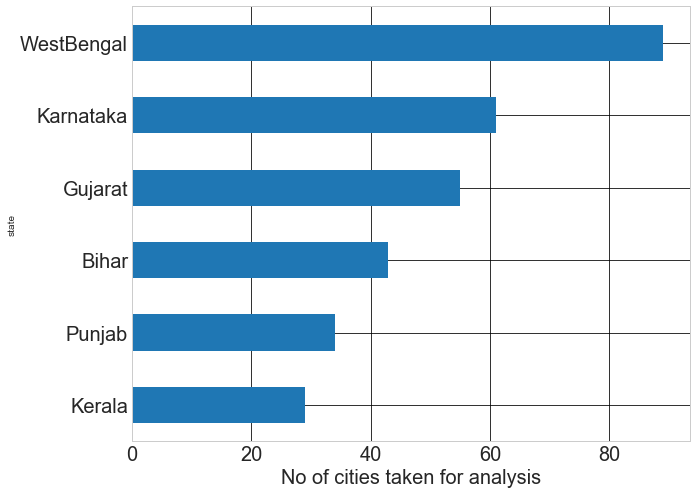

In [64]:
fig = plt.figure(figsize=(10,8))
states = events_statewise.groupby('state')['city'].nunique().sort_values(ascending=True)
states.plot(kind="barh", fontsize = 20)
plt.grid(b=True, which='both', color='Black',linestyle='-')
plt.xlabel('No of cities taken for analysis', fontsize = 20)
plt.show ()

89 cities were from West Bengal followed by 61 from Karnataka.

<a id="section417"></a>
### 4.17 Plotting the users on the map

In [73]:
!pip install folium

In [65]:
import folium
from folium.plugins import HeatMap

In [66]:
# Get the information of events table for 6 states
events_statewise.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19032 entries, 2829979 to 3252949
Data columns (total 14 columns):
event_id        19032 non-null float64
device_id       19032 non-null int64
timestamp       19032 non-null object
longitude       19032 non-null float64
latitude        19032 non-null float64
city            19032 non-null object
state           19032 non-null object
Date            19032 non-null object
Time            19032 non-null object
dayofweek       19032 non-null object
week/weekend    19032 non-null object
Hour            19032 non-null object
AM/PM           19032 non-null object
Day/Night       19032 non-null object
dtypes: float64(3), int64(1), object(10)
memory usage: 2.8+ MB


In [67]:
# A total of 311 cities from 6 states.
this_map = folium.Map(prefer_canvas=True)

def plotDot(point):
    folium.CircleMarker(location=[point.latitude, point.longitude],radius=2,fill_color='red').add_to(this_map)

#use df.apply(,axis=1) to iterate through every row in your dataframe
events_statewise.apply(plotDot, axis = 1)
this_map.fit_bounds(this_map.get_bounds())
this_map

Exporting the events table to upload into the dashboard

In [68]:
events_dash=events_statewise.drop(columns=['city','Date', 'Time', 'dayofweek', 'week/weekend', 'Hour', 'AM/PM', 'Day/Night'])

In [69]:
events_dash.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19032 entries, 2829979 to 3252949
Data columns (total 6 columns):
event_id     19032 non-null float64
device_id    19032 non-null int64
timestamp    19032 non-null object
longitude    19032 non-null float64
latitude     19032 non-null float64
state        19032 non-null object
dtypes: float64(3), int64(1), object(2)
memory usage: 1.6+ MB


In [70]:
events_dash.to_csv('group_1042.csv', index=False) 